# Fractional Cover TensorFlow Model <img align="right" src="../Supplementary_data/DE_Africa_Logo_Stacked_RGB_small.jpg">

* **Products used:** 
[ls_usgs_fc_scene](https://explorer.digitalearth.africa/ls_usgs_fc_scene), 
[ls_usgs_wofs_scene](https://explorer.digitalearth.africa/ls_usgs_wofs_scene),
[s2_l2a](https://explorer.digitalearth.africa/s2_l2a),
* **Prerequisites:** For more details and better understanding of the input datasets and method used, see the notebooks covering [Sentinel-2](../Datasets/Sentinel_2.ipynb), [Applying WOfS bitmasking](../Frequently_used_code/Applying_WOfS_bitmasking.ipynb) and [Geomedian](../Frequently_used_code/Generating_geomedian_composites.ipynb).


### Background

The Fractional Cover (FC) product provides estimates of the proportions of green vegetation, non-green vegetation (including deciduous trees during autumn, dry grass, etc.), and bare soils for every Landsat or Sentinel-2 pixel.

This product supports a range of environmental and agricultural applications, including soil erosion monitoring, land surface process modelling, land management and vegetation studies. The information can be used by policy agencies, natural and agricultural land resource managers, and scientists to monitor land conditions over large areas over long time periods.

The algorithm is developed by the Joint Remote Sensing Research Program (JRSRP) and is described in Scarth et al. (2010). Field data collected across Australia have been used to calibrate and validate the unmixing model.

More information on the product can be found [here](http://data.auscover.org.au/xwiki/bin/view/Product+pages/Landsat+Seasonal+Fractional+Cover).

**Reference**

Scarth, P, Roder, A and Schmidt, M 2010, 'Tracking grazing pressure and climate interaction - the role of Landsat fractional cover in time series analysis', Proceedings of the 15th Australasian Remote Sensing & Photogrammetry Conference (ARSPC), 13-17 September, Alice Springs, Australia. Alice Springs, NT.



## Description

This notebook will cover following topics:

1. Loading, masking and visualizing pre-generated FC data.
2. Calculating FC from Sentinel-2 surface reflectance and generating monthly composites.

***

## Getting started

To use this notebook, run the cells in this section, under "Load packages", "Connect to the datacube" and "Analysis parameters".

The two sections below, "Loading, masking and visualizing pre-generated FC data" and "Calculating FC from Sentinel-2 surface reflectance" can be run independently.

### Load packages
Import Python packages that are used for the analysis.

In [1]:
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import xarray as xr
import numpy as np
import tflite_runtime.interpreter as tflite

import datacube
from datacube.utils import masking
from odc.algo import xr_geomedian

import sys
sys.path.append('../Scripts')
from deafrica_datahandling import load_ard
from deafrica_plotting import rgb
from deafrica_classificationtools import sklearn_flatten, sklearn_unflatten

/env/lib/python3.6/site-packages/datacube/storage/masking.py:4: DeprecationWarning: datacube.storage.masking has moved to datacube.utils.masking
  category=DeprecationWarning)


### Connect to the datacube

Connect to the datacube so we can access DE Africa data.

In [3]:
dc = datacube.Datacube(app='fractional_cover')

### Analysis parameters

This section defines the analysis parameters, including 

* `lat, lon, buffer`: center lat/lon and analysis window size for the area of interest
* `time_period`: time period to be investigated
* `output_crs`: projection for loading data; output resolution is not defined so different resolutions can be used for Landsat and Sentinel-2
* `min_gooddata`: minimum fraction of good data required for a (FC or surface reflectance) scene to be kept

The default location is an area along Dawa river on the Ethiopia-Kenya border.

Default resolution, spatial and temporal extents are chosen to limit the time required for calculating FC from Sentinel-2 surface reflectance.

In [4]:
lat, lon = 3.96, 41.64

buffer_lat, buffer_lon = 0.03, 0.04

time_period = ('2017-01', '2017-12')

output_crs = 'epsg:6933'

min_gooddata = 0.9

In [5]:
#generate a query object from the analysis parameters
query = {
    'time': time_period,
    'x': (lon - buffer_lon, lon + buffer_lon),
    'y': (lat + buffer_lat, lat - buffer_lat),
    'output_crs': output_crs,
}

## Calculating FC from Sentinel-2 surface reflectance

FC can be generated on-the-fly from surface reflectance data.

In this example, surface reflectance in Sentinel-2 bands `green`(B03), `red`(B04), `nir`(B08), `swir_1`(B11) and `swir_2`(B12) are used, assuming they are equivalent to similarly named Landsat spectral bands. 

In [6]:
# Define spectral bands to use
bands = ['green','red','nir','swir_1','swir_2']

### Load Sentinel-2 surface reflectance

Use the provided scene classification layer to mask out water, snow, cloud and cloud_shadow. 

> The `cloud_cover` parameter is used to reject mostly cloudy input granules.
> This helps to reduce noisy results from missed clouds.
> This `cloud_cover` is calculated over the entire Sentinel-2 granule, not for the area of interest in this analysis.

In [7]:
# load clear sentinel-2 data at 20 m spatial resolution

s2 = load_ard(dc=dc,
              products=['s2_l2a'],
              measurements=bands,
              pq_categories_s2=['vegetation', 'bare soils', 'unclassified', 'dark area pixels'],
              min_gooddata=min_gooddata,
              #dask_chunks={},
              group_by='solar_day',
              cloud_cover = (0, 40),
              resolution = (-20, 20),
              **query)

Using pixel quality parameters for Sentinel 2
Finding datasets
    s2_l2a
Counting good quality pixels for each time step
Filtering to 25 out of 33 time steps with at least 90.0% good quality pixels
Applying pixel quality/cloud mask
Loading 25 time steps


### Apply spectral unmixing

This calculation takes about 10 minutes for the default parameters.

In [8]:
FC_MODEL = 'fcModel_256x64x256.tflite'

# The unmixing model
def unmixfc(ds):
    """
    Compute fractional cover from an input data array.
    
    Parameters
    ---------- 
    ds: xr.DataSet
        A xr.Dataset with spectral bands in order and equivalent to ['green','red','nir','swir_1','swir_2']

    Returns
    -------
    A xr.DataSet containing the FC components.  
    """
    # save valid pixel mask
    valid = ds.to_array().notnull().all(axis=0)
    # reshape
    input_array = sklearn_flatten(ds/10000)*np.array([1.0582, 0.9871, 1.0187, 0.9528, 0.9688], dtype='float32') + np.array([0.0031, 0.0064, 0.012, 0.0079, -0.0042], dtype='float32')
    
    # Run the prediction using TFLite
    fcModel = tflite.Interpreter(model_path=FC_MODEL)
    inputDetails = fcModel.get_input_details()
    outputDetails = fcModel.get_output_details()
    fcModel.resize_tensor_input(inputDetails[0]['index'], input_array.shape)
    fcModel.allocate_tensors()
    fcModel.set_tensor(inputDetails[0]['index'], input_array.astype(np.float32))
    fcModel.invoke()
    fcLayers = fcModel.get_tensor(outputDetails[0]['index'])
    # Clean up low/high values
    fcLayers = np.clip(fcLayers.T,0,2)
    fcLayerSum = fcLayers.sum(axis=0) + np.finfo('float32').eps
    outputFC = np.round(100 * fcLayers/fcLayerSum, 0)
    
    # Set noData as 255
    outputFC[:, input_array[:,0] < 0.001] = 255
    outputFC[:, input_array[:,0] > 0.999] = 255
    
    # Reshape the FC Output
    out = sklearn_unflatten(outputFC.transpose(), ds).astype(np.uint8)
    out.coords[out.dims[0]]=['BS', 'PV', 'NPV']
    # Set invalid as 255
    out = out.where(valid, 255)
    
    # convert to dataset
    if 'time' in ds.dims:
        out = out.to_dataset(dim=out.dims[0]).transpose('time','y','x')
    else:
        out = out.to_dataset(dim=out.dims[0]).transpose('y','x')
    
    return out


In [9]:
%%time 
s2_fc = unmixfc(s2[bands])

CPU times: user 15.4 s, sys: 2.26 s, total: 17.7 s
Wall time: 17.7 s


### Visualize Sentinel-2 based FC at monthly interval

Sentinel-2 has frequent temporal coverage, however, the scene classification fails to identify some clouds.
The FC results can be aggreated monthly to reduce the impact of clouds.

> Monthly composites are generated using the `geomedian` method, which maintains the relationship between the BS, PV and NPV components.
> For more details of this method, see the [Geomedian notebook](../Frequently_used_code/Generating_geomedian_composites.ipynb)

In [10]:
# generate monthly geomedian, the xr_geomedian function requires float32 input
s2_monthly_gm = s2_fc.where(s2_fc<100)[['BS','PV','NPV']].astype('float32').resample(time='M').apply(xr_geomedian).dropna(dim='time', how='all')

Automatically using 16 threads.
Automatically using 16 threads.
Automatically using 16 threads.
Automatically using 16 threads.
Automatically using 16 threads.
Automatically using 16 threads.
Automatically using 16 threads.
Automatically using 16 threads.
Automatically using 16 threads.
Automatically using 16 threads.


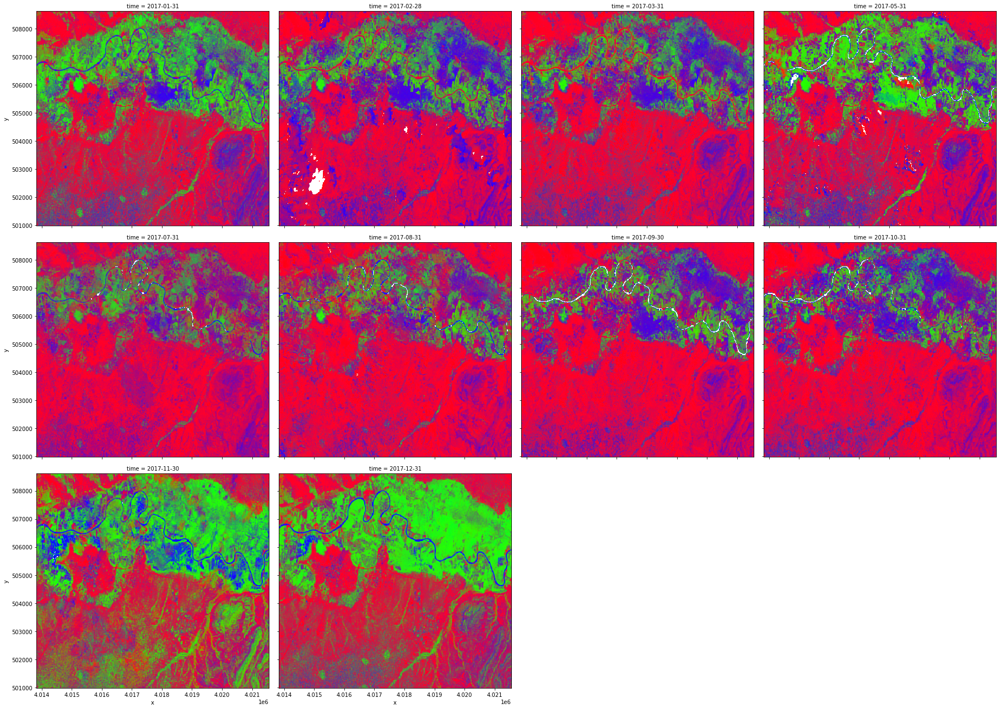

In [11]:
rgb(s2_monthly_gm,
    col='time',
    bands=['BS','PV','NPV'],
    col_wrap=4)

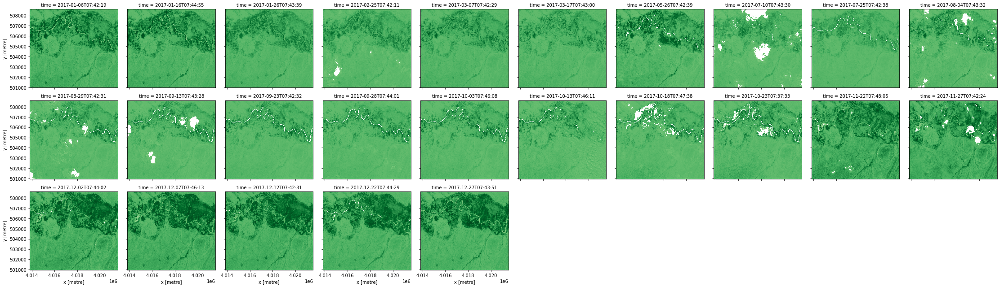

In [27]:
ndvi=(s2.nir-s2.red)/(s2.nir+s2.red)
ndvi.plot.imshow(col='time', col_wrap=10, cmap='Greens', add_colorbar=False);

In [32]:
%%time
from fc.fractional_cover import compute_fractions

def compute_fc(input_da, 
               regression_coefficients = {'green':[31, 1.0582], 'red':[64, 0.9871], 'nir':[120, 1.0187], 'swir1':[79, 0.9528],'swir2':[-42, 0.9688]}
              ):
    """
    Compute fractional cover from an input data array.
    
    Parameters
    ---------- 
    input_da: xr.DataArray
        A 3-dimensional dataArray with the first dimension being spectral bands
    
    regression_coefficients: dict, optional
        A dictionary containing linear regression coefficients to transform the input spectral bands
        e.g. {'green':[31, 1.0582],
              'red':[64, 0.9871],
              'nir':[120, 1.0187],
              'swir1':[79, 0.9528],
              'swir2':[-42, 0.9688]}

    Returns
    -------
    A 3-dimensional xr.DataArray with the first dimension containing the FC components.  
    """
    # prepare input data
    is_valid_array= (input_da >0).all(dim=input_da.dims[0])
    input_da = input_da.where(is_valid_array, 0)
    # define output coordinates
    output_coords = {'variable': ['PV', 'NPV', 'BS', 'UE']}
    output_dims = ['variable']
    for dim in input_da.dims[1:]:
        output_coords[dim] = input_da.coords[dim]
        output_dims.append(dim)
    # calculate FC
    output = compute_fractions(input_da, regression_coefficients = regression_coefficients)
    # nodata value is -1
    return xr.DataArray(output, coords=output_coords, dims=output_dims).where(is_valid_array, -1)


input_data = s2[bands].to_array(dim='band')#.chunk({'band':-1})
output = input_data.groupby('time').apply(compute_fc)
# convert to dataset to be compatible with pre-generated data
s2_fc_orig = output.to_dataset(dim='variable')

CPU times: user 16.6 s, sys: 2.31 s, total: 18.9 s
Wall time: 14.8 s


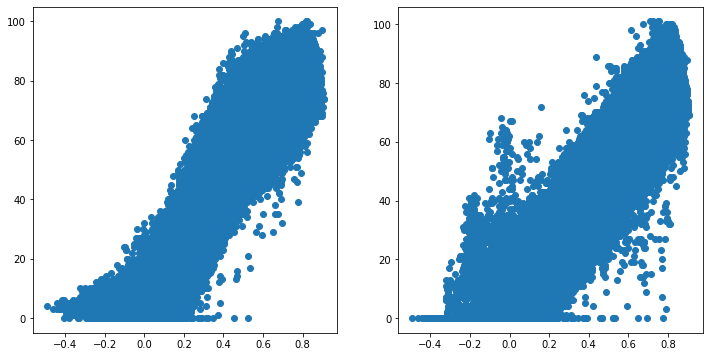

In [33]:
from matplotlib import pyplot as plt
fig, ax= plt.subplots(1, 2, figsize=(12, 6))
ax[0].scatter(ndvi.values, s2_fc.PV.values)
ax[1].scatter(ndvi.values, s2_fc_orig.PV.values)

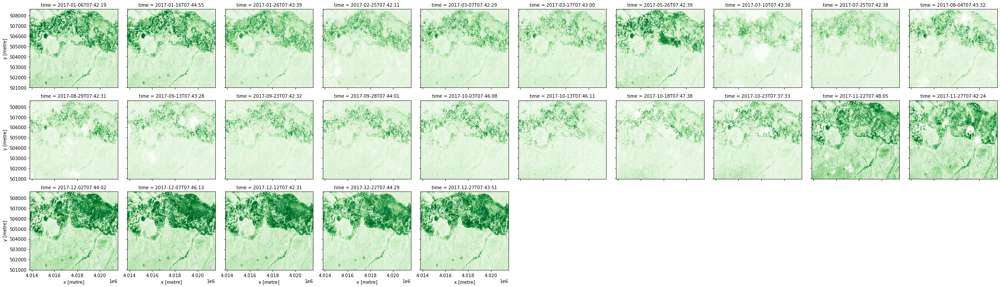

In [26]:
test= (ndvi/0.8).where(ndvi>0,0)*100
test.plot.imshow(col='time', col_wrap=10, cmap='Greens', add_colorbar=False);

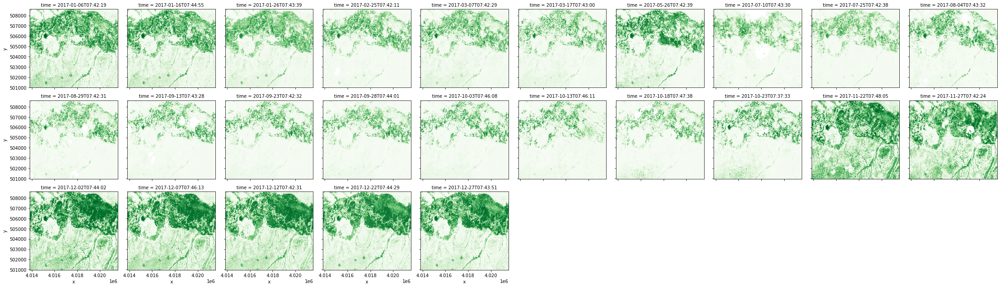

In [20]:
s2_fc.PV.where(s2_fc.PV<100).plot.imshow(col='time', col_wrap=10, cmap='Greens', add_colorbar=False);

***

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Last modified:** July 2020

**Compatible datacube version:** 

In [12]:
print(datacube.__version__)

1.8.2.dev7+gdcab0e02


## Tags
Browse all available tags on the DE Africa User Guide's [Tags Index](https://) (placeholder as this does not exist yet)